<a href="https://colab.research.google.com/github/aaliyahee/MachineVision/blob/main/LocalDescriptor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv_imshow
import subprocess
subprocess.call("pip install -U opencv-python".split())

0

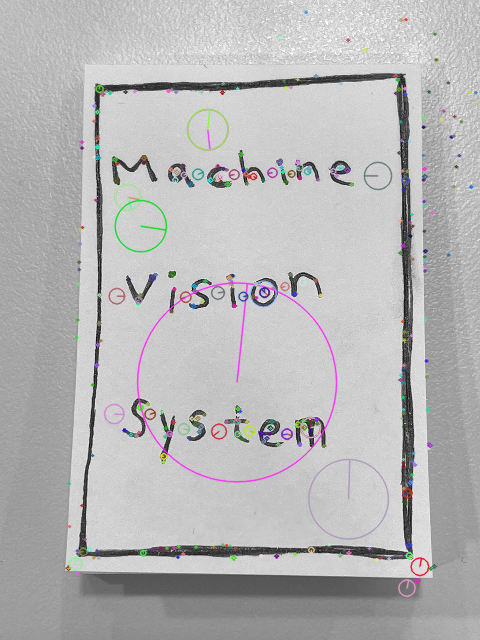

In [16]:
img1 = cv.imread('gdrive/MyDrive/MachineVision/memo1.jpg') 
img1 = cv.resize(img1,(480,640))
gray = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)

# 특정 물체만 촬영된 영상 SIFT 방법으로 blob 검출
sift = cv.SIFT_create()
kp = sift.detect(gray,None)

img1_b = cv.drawKeypoints(gray, kp, img1, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img1_b)

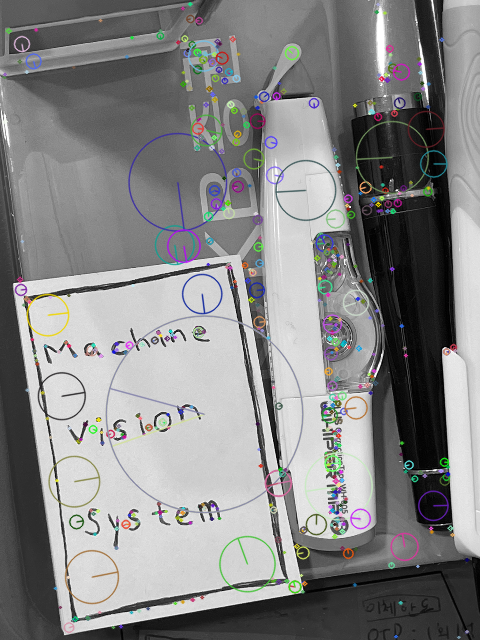

In [17]:
img2 = cv.imread('gdrive/MyDrive/MachineVision/memo2.jpg') 
img2 = cv.resize(img2,(480,640))
gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

# 해당 물체가 다른 물체들과 함께 촬영된 영상 SIFT 방법으로 blob 검출
sift = cv.SIFT_create()
kp = sift.detect(gray,None)

img2_b = cv.drawKeypoints(gray, kp, img2, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img2_b)

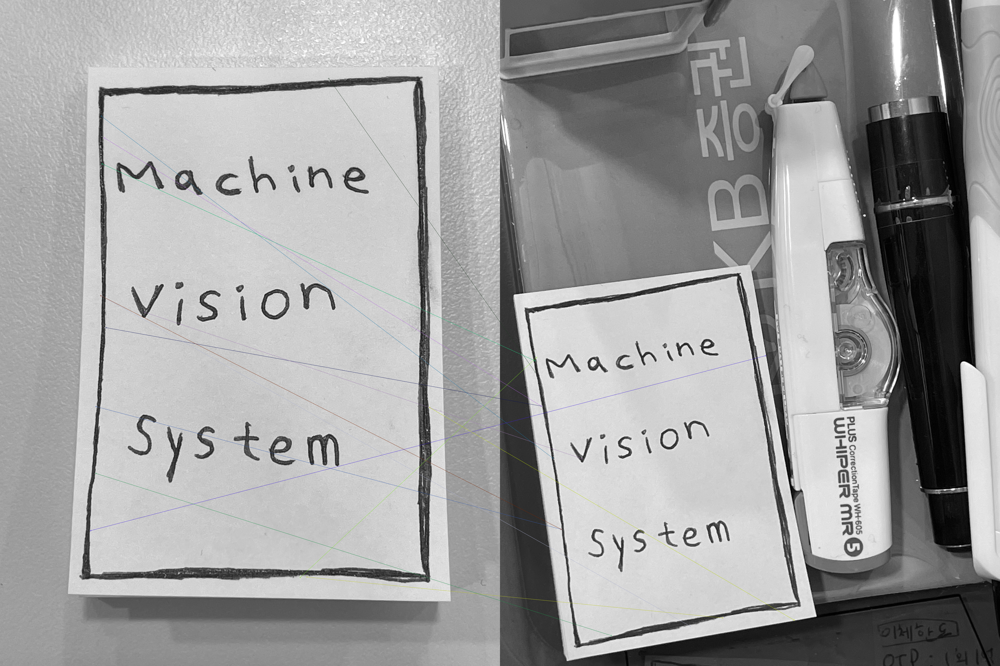

In [21]:
img1 = cv.imread('gdrive/MyDrive/MachineVision/memo1.jpg',cv.IMREAD_GRAYSCALE)
img2 = cv.imread('gdrive/MyDrive/MachineVision/memo2.jpg',cv.IMREAD_GRAYSCALE)

# Find the keypoints and descriptors
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None) 
kp2, des2 = sift.detectAndCompute(img2,None)

# Match descriptors
bf = cv.BFMatcher()
matches = bf.match(des1,des2)

# Sort them in the order of their distance
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 15 matches
img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:15], None, flags = cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv_imshow(img3)

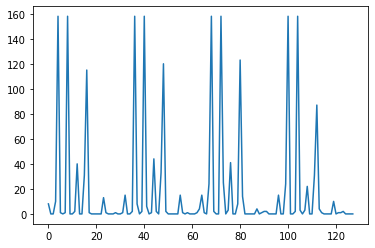

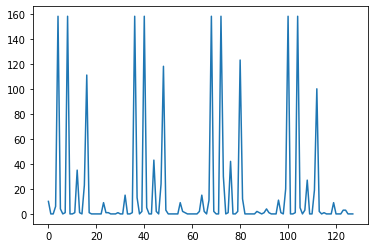

([<matplotlib.lines.Line2D at 0x7f563154a4d0>], None)

In [20]:
# 그래프 그려서 두 벡터가 실제로 유사한지 확인
import matplotlib.pyplot as plt
plt.plot(np.arange(128), des1[matches[0].queryIdx]), plt.show()
plt.plot(np.arange(128), des2[matches[0].trainIdx]), plt.show()